<a href="https://colab.research.google.com/github/KanishkaEkanayaka/Dog-Breed-Prediction/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-End Multi Class Dog Breed Classification

This notebook builds end-to-end multi class image classifier using TensorFlow 2.0(2.13) and TenserFlow Hub.

## 1. Problem

Identify breed of a dog by looking at the given image.

I need to get a dog breed using a photo of a dog which I see in the public.

## 2. Data

The data that we are using is from kaggle dog breed identification compition.

https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog image of test images.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the features:
* We are dealing with images(Unstructured data). Since data are unstructured it's good to use deep learning/transfer learning to model the data.
* We need to check the dog breed of given dog image
* There are 120 dog breeds given which means we have data set with multiple classes actually 120 classes.
* There are test images and train images.
* train images are given with labels that indicates the breed of the dog that image holds.
* Using train set we have to train the model but to predict the dog breeds of the dog images on test set.

In [ ]:
# unzip the uploaded data into google drive.
# !unzip '/content/drive/MyDrive/Dog Vision/dog-breed-identification.zip' -d '/content/drive/MyDrive/Dog Vision/'

### Get our workspace ready

* import tensorflow 2.x
* import tensorflow hub
* make sure we are using a GPU

In [ ]:
# import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print('TensorFlow version: ' , tf.__version__)
print('TensorFlow hub version: ', hub.__version__)

# Check for GPU availability
print('GPU', 'Available' if tf.config.list_physical_devices('GPU') else 'Not available')

TensorFlow version:  2.12.0
TensorFlow hub version:  0.14.0
GPU Available


## 5. Modelling

### 1. Getting data ready (Turning into tensors(special matrix which hold numerical values))

To work with any machine learning model our data has to be in numerical format.
That what we are going to do in here.
turning our images into tensors.

Let's start by accessing our data and checking out the labels.

### EDA (Exploratory Data Analysis)

In [ ]:
# Checkout the labels of our data

import pandas as pd
labels_csv = pd.read_csv('/content/drive/MyDrive/Dog Vision/labels.csv')
print(labels_csv.describe())
print(labels_csv.info())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10222 entries, 0 to 10221
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      10222 non-null  object
 1   breed   10222 non-null  object
dtypes: object(2)
memory usage: 159.8+ KB
None
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


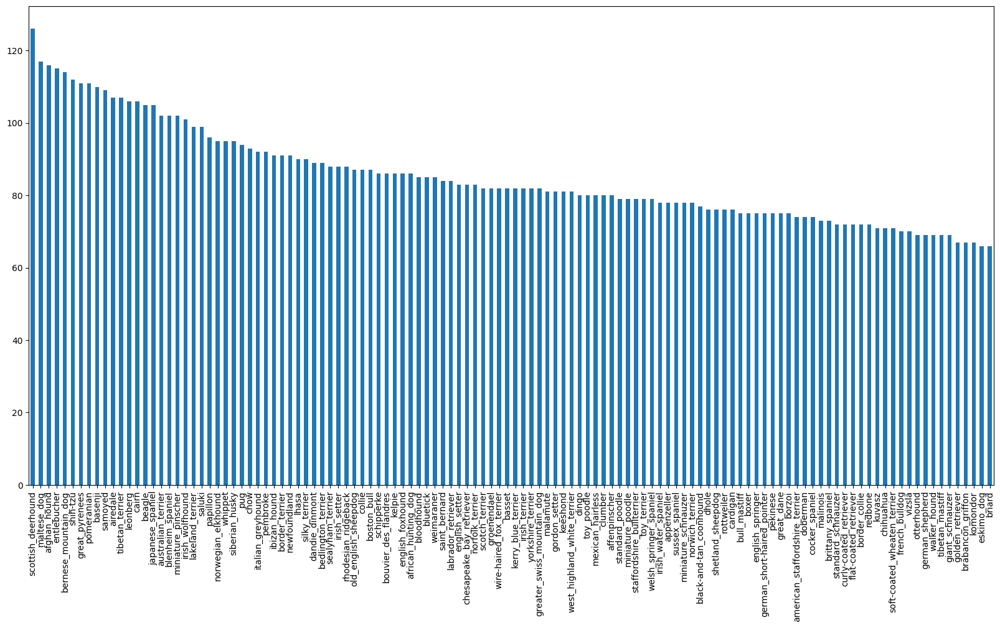

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10));

In [ ]:
# Get the median of the dog breed frequency
labels_csv['breed'].value_counts().median()

82.0

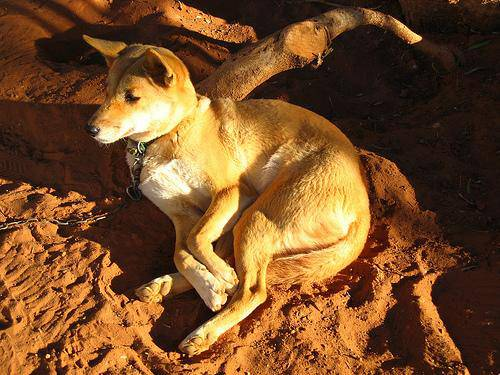

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all of our image file pathnames

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv['id']]

# View first 10 filenames
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check the number of filenames or files provided in labels are equals to the actual number of images in the train folder
import os
if len(os.listdir('drive/MyDrive/Dog Vision/train')) == len(filenames):
  print('number of files in the labels_csv is equal to number of images in the train folder')
else:
  print('number of files(rows) in the labels_csv not equal to number of images in the train folder')

number of files in the labels_csv is equal to number of images in the train folder


In [ ]:
# Let's test some more data
filenames[9000]

'drive/MyDrive/Dog Vision/train/e20e32bf114141e20a1af854ca4d0ecc.jpg'

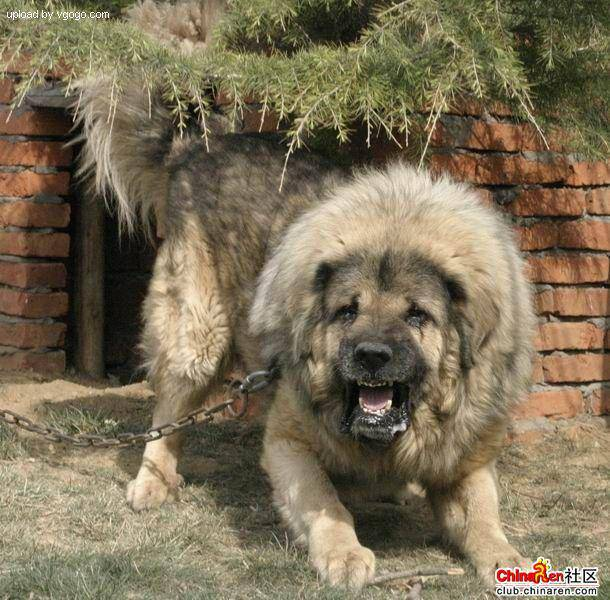

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv['breed'][9000]

'tibetan_mastiff'

Since we have go our training images file paths in a list, Let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv['breed'].to_numpy()
#labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# Check if number of labels is equal to number of filenames
if len(labels) == len(filenames):
  print('number of labels equal to number of filenames')
else:
  print('number of labels NOT EQUAL to number of filenames')

number of labels equal to number of filenames


In [ ]:
#Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
# Compare single label in the labels array with unique breeds to identify what unique breed is match to this unique breed
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) #name of the label
print(np.where(unique_breeds == labels[0])) #index where labels occurs
print(boolean_labels[0].argmax()) #Print where the true values are in the first array of boolean labels array
print(boolean_labels[0].astype(int)) # There will be a one were sample variable occur

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
# Example: Turning boolean array into integers
print(labels[1])
print(np.where(unique_breeds == labels[1]))
print(boolean_labels[1].argmax())
print(boolean_labels[1].astype(int))

dingo
(array([37]),)
37
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Create our own validation set

Since kaggle dataset doesn't provide us any validation dataset. We are going to create our own validation set.

In [ ]:
# Setup x and y

x = filenames
y = boolean_labels

We are going to start with 1000 data and increase the dataset as needed

In [ ]:
# Set number of data for use first to train the model.First we start with 1000 data because it takes huge time if we take all the data and start train it with all the data.
NUM_IMAGES = 1000 #@param {type:'slider',min: 1000,max: 10000,step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split data into training set and validation set of total size NUM_IMAGES
x_train, x_val , y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                   y[:NUM_IMAGES],
                                                   test_size=0.2,
                                                   random_state=42
                                                   )
len(x_train), len(x_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
# Let's look some data in training sets
x_train[:2],y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

### Preprocessing images (Turning Images into tensors)

To preprocess our images into tensors we are going to write a function which do few things

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it into a variable `image`
3. Turn our `image` into Tensors
4. Normalizing the image (convert RGB values from 0-255 to 0-1)
4. Resize the image to be a shape of (224,224)
5. Return the modified image.

Before we create function for image preprocessing, Let's see what imported image looks like.

In [ ]:
# Convert image to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape #will output height,width,color channel

(257, 350, 3)

In [ ]:
image #array consist of arrays of color channels

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]

In [ ]:
# Convert numpy array which image contained into Trnsor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

Let's make a function to preprocess the image

In [ ]:
# Declare the image sizing size
IMG_SIZE = 224

# Create function for Preprocessing image
def process_image(image_path, IMG_SIZE=IMG_SIZE):
  '''
  Taken image path and turn image into Tensor
  '''

  # Read in image
  image = tf.io.read_file(image_path)

  # Turn the jpeg image into numerical Tensor with three color channels(RGB)
  image = tf.image.decode_jpeg(image,channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values (This is called normaliation, this ease the computations)
  image = tf.image.convert_image_dtype(image, tf.float32) # This will convert all the RGB values in the array to floating numbers
  # Resize the image to our desired value(224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

Normalization is a technique often applied as part of data preparation for machine learning. The goal of normalization is to change the values of numeric columns in the dataset to use a common scale, without distorting differences in the ranges of values or losing information


#### Turning images into batches

Why turn our data into batches?

Let's say u are going to preprocessing 10,000+ images at one go. They all **might not fit into meemory**.

So, that's why we do 32(32 is the batch size that we get here) images at a time. You can manually ajust the batch size.

To use tensorflow effectively, we need our tensor tuple in this form.(`image`:`label`)

In [ ]:
# Create a function to build a tuple which looks like (image:label)
def get_image_label(image_path,label):
  '''
  take image path with the associated label turn tuple with image and label(image:label) and return it
  '''
  image = process_image(image_path)
  return image, label

In [ ]:
demo = get_image_label(x[42],y[42])
demo

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Let's create a function to turn all our data(x,y) into batches


In [ ]:
# Define the batch size 32 is a good start
BATCH_SIZE = 32

# Create function to turn data into batches
def create_data_batches(x,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  '''
  Create batches of data out of image(x) and label(y) pairs.
  Shuffles the data if it is training data because we need to train our model in a full effective manner, but doesn't shuffle if it's validation data.
  Also accept test data with no labels as inputs
  '''
  # If data is test data we probably do not have labels
  if test_data:
    print('creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # test data don't have labels
    # convert image paths to a preprocessed images and create batches.
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch

  # if the data is validation data we dont need to shuffle it
  elif valid_data:
    print('creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), #file paths
                                               tf.constant(y))) #labels
    # First create image label tupples.get_image_label will also preprocess given image path to a image and return the tuple of (image:label). then create data batches.
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

  else:
    print('Creating training data batches.....')
    # Turn file paths and labels into tuple of tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), #file paths
                                               tf.constant(y)))#labels
    # Shuffle the dataset which contains filepaths and labels in the form of tensors
    data = data.shuffle(buffer_size=len(x)) #buffer_size indicates how many data we need to shuffle here we need all the data to be shuffled.

    # Create (image,label) tupple this is also convert file path to a image and preprocess it.
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(batch_size)

    return data_batch


In [ ]:
# Create training and validation data batches
train_data = create_data_batches(x_train,y_train)
val_data = create_data_batches(x_val,y_val,valid_data=True)

Creating training data batches.....
creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

#### Visualizing data batches

Our data is now in batches but these are little hard to understand lets vusalize them!

In [ ]:
import matplotlib.pyplot as plt

# Create a function to show images in  a data batch
def show_30_images(images,labels):
  '''
  Display a plot of 25 images and there labels from a data batch
  '''
  # Setup the figure
  plt.figure(figsize=(10,10))
  #loop through 30 for display 30 images
  for i in range(30):
    # Create subplots (6 rows 5 columns)
    ax = plt.subplot(6,5,i+1) # rows,columns,index
    # display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()]) # take the i the label of the labels and take the index where the value is one using argmax and take the breed name from unique breeds which associated to the index where boolean value become 1 in label
    #turn the grid lines off
    plt.axis('off')

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator()) # THis is going to take the next batch from the train_data and seperate out the tuple into train_images and train_labels
train_images, train_labels

(array([[[[0.25378153, 0.0812325 , 0.04593838],
          [0.33182773, 0.15329131, 0.1160014 ],
          [0.3402311 , 0.15591738, 0.11670168],
          ...,
          [0.5903711 , 0.30801812, 0.1589985 ],
          [0.57461464, 0.29226172, 0.13939042],
          [0.5621149 , 0.27976194, 0.1228992 ]],
 
         [[0.24717546, 0.07462642, 0.0393323 ],
          [0.32193628, 0.14339986, 0.10610995],
          [0.3353737 , 0.15105996, 0.11184428],
          ...,
          [0.5599196 , 0.27756664, 0.12854701],
          [0.55476123, 0.27240828, 0.119537  ],
          [0.54957396, 0.26722097, 0.11035823]],
 
         [[0.24067411, 0.06812507, 0.03283095],
          [0.30706862, 0.12957464, 0.09193724],
          [0.32609108, 0.14382565, 0.1039272 ],
          ...,
          [0.5230148 , 0.24066181, 0.09164219],
          [0.53317434, 0.2508214 , 0.09795012],
          [0.53895575, 0.2566028 , 0.09974005]],
 
         ...,
 
         [[0.2862264 , 0.24767599, 0.24109334],
          [0.35432

In [ ]:
len(train_images),len(train_labels)

(32, 32)

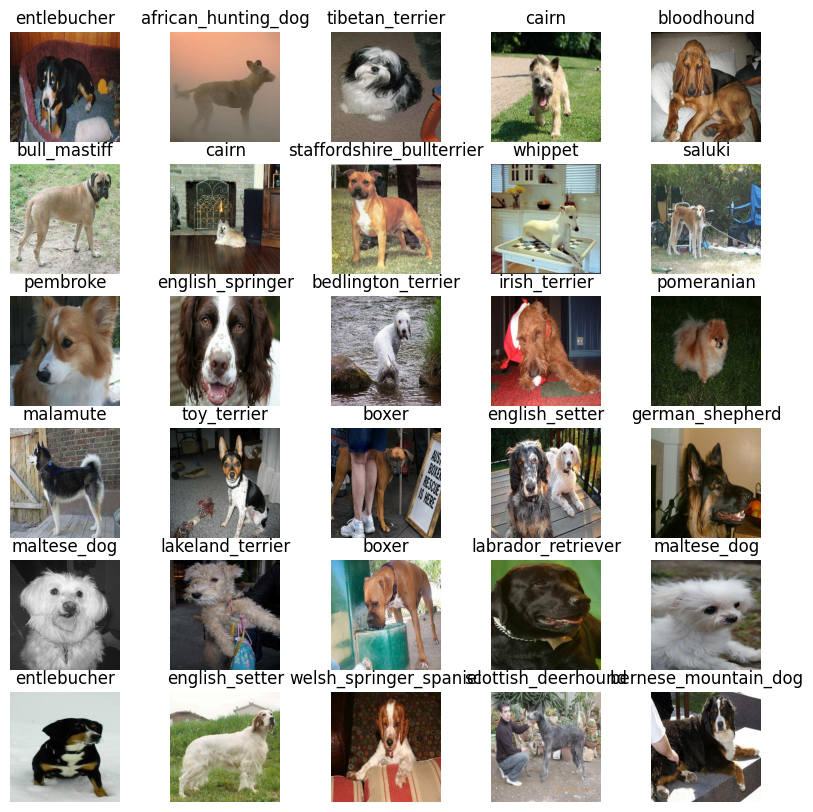

In [ ]:
#Now let's visualize the data in the training batch
show_30_images(train_images, train_labels)

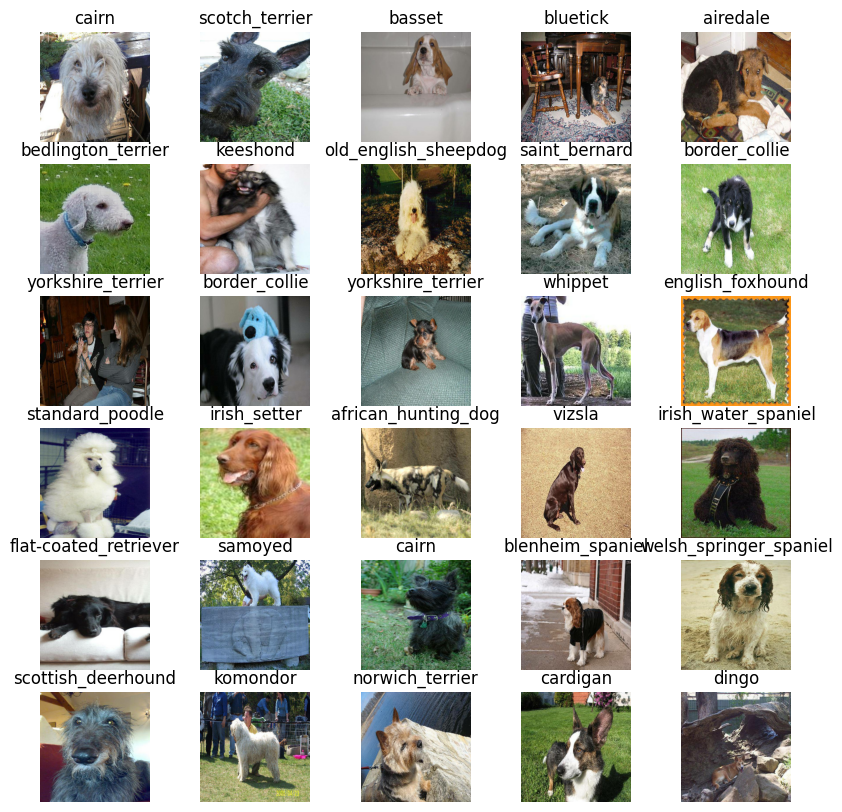

In [ ]:
#Now let's visulaize 30 images from a batch from validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_30_images(val_images, val_labels)

## 2. Building a model (Pick a model)

Before we build a model, there are few things that we need to define:
* The input shape(our images shape in the form of tensors) to our model.
* The output shape (Image labels in the form of tensors) to our model.
* The URL of the model that we need to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# train_data.element specs specified values need to be assigned to theses INPUR_SHAPE and OUTPUT_SHAPE

# Setup input shape to the model.
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # Batch height width color channels.

# Set up output shape to the model
OUTPUT_SHAPE = len(unique_breeds)

# Setup URL for TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we got out input, output and model to go.
Let's put them together to kerus deep learning model

Let's create a function which:

* take input shape, output shape and the model we have choosen as parameters.
* Define layers in a kerus model in sequential fashion.(Do this first, then this, then that)
* Compiles the model( says it should be evaluated and improved)
* Build the model(Tell the model the input shape that it will be getting)
* Return the model

All the steps can be find here:
https://www.tensorflow.org/guide/keras

In [ ]:
# Create a function which builds a keras model.

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url = MODEL_URL):
  print('Building model with: ', MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # layer 1 (input layer)
      tf.keras.layers.Dense(units=output_shape,activation='softmax') # layer2 (output layer) if binary classification activation = sigmoid
  ])#We need only 120 units which is equals to our unique label amount as our output layer.

  # compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(), # if binary classification, loss=binary crossentrophy
      optimizer= tf.keras.optimizers.Adam(),
      metrics = ['accuracy']
  )

  #build the model
  model.build(input_shape)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


### Creating callbacks

callbacks are helper functions that a model can use during training to do things like save progress, check its progress, stop training early if a model stop improving.

We'll create 2 callbacks

one for TensorBoards which help to track our models progress
other for early stopping the training of our model.

### TensorBoard callback

To setup a TensorBoard callback we need to do 3 things:
1. Load TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit` function.
3. Visualize our models training logs with `%tensorboard` magic function (We'll do this after model training)

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join('drive/MyDrive/Dog Vision/logs',
                        #make it so the logs get tracked when ever we run an experiment
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  # passing callback function to tensor board to store the progress or the logs
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

Stop training when a monitored metric has stopped improving.

Early stopping help our model getting overfitting by stopping training our model if a certain metric has stopped improving

In [ ]:
#Create early stopping callback

early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',patience=3) #monitor validation accuracy. If it does not improving we are going to stop the training of the model
#The patience parameter determines how many consecutive epochs the monitored metric can remain stagnant without improvement before the training is stopped.
#In this case, it's set to 3, meaning that if the validation accuracy doesn't improve for 3 consecutive epochs, the training will be stopped.

### Training a model (on subset of data)

Our first model is only going to work with 1000 images, to make sure that the everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider",min:10,max:100,step:10}

In [ ]:
# Check to make sure that we are still running on GPU
print('GPU', 'available' if tf.config.list_physical_devices('GPU') else "not available")

GPU available


Let's create a function which trains a model

* create a model using `create_model`
* Setup TensorFlow callback using `create_tensorboard_callback`
* call `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use.
* Return the model

In [ ]:
# Build a function to train and return the trained model
def train_model():
  '''
  Trains the given model and return the trained version
  '''
  #create a model
  model = create_model()

  # Create a new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data and passing it the callbacks
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # Do validation for every epochs, one time per epoch.
            callbacks=[tensorboard,early_stopping])
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 178s 5s/step - loss: 4.6855 - accuracy: 0.0975 - val_loss: 3.5404 - val_accuracy: 0.2250
Epoch 2/100
25/25 [==============================] - 4s 171ms/step - loss: 1.6997 - accuracy: 0.6750 - val_loss: 2.1998 - val_accuracy: 0.5150
Epoch 3/100
25/25 [==============================] - 6s 245ms/step - loss: 0.5796 - accuracy: 0.9463 - val_loss: 1.6751 - val_accuracy: 0.5650
Epoch 4/100
25/25 [==============================] - 4s 164ms/step - loss: 0.2518 - accuracy: 0.9887 - val_loss: 1.4977 - val_accuracy: 0.5900
Epoch 5/100
25/25 [==============================] - 6s 247ms/step - loss: 0.1456 - accuracy: 0.9975 - val_loss: 1.4205 - val_accuracy: 0.6150
Epoch 6/100
25/25 [==============================] - 5s 183ms/step - loss: 0.1010 - accuracy: 1.0000 - val_loss: 1.3751 - val_accuracy: 0.6150
Epoch 7/100
25/25 [==============================

**question:** It's look like our model is overfitting because it perform far better on the training set than the validation set, What are some ways to reduce the model overfitting in deep neural networks?

### Checking the TensorBoard logs
The TensorBoard magic function `%tensorboard` will access the log directory we created earlier and visualize its content.

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating the predictions using the trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
predictions = model.predict(val_data, verbose=1) # Make predictions using val_data batch
predictions

7/7 [==============================] - 3s 95ms/step


array([[7.0419034e-04, 3.7671802e-05, 3.1607063e-04, ..., 1.7895167e-03,
        7.9616057e-06, 1.9267298e-03],
       [3.1049447e-03, 6.7234716e-05, 6.4399670e-04, ..., 6.5231381e-04,
        4.8025562e-03, 3.9686609e-05],
       [5.9434042e-06, 8.8012443e-05, 3.2222193e-05, ..., 5.6971232e-05,
        3.4171444e-05, 1.2063283e-04],
       ...,
       [8.4411649e-06, 5.8116093e-05, 4.6070939e-04, ..., 7.8787343e-05,
        8.7429406e-05, 3.7084459e-04],
       [1.0561487e-03, 2.7663575e-05, 5.7488869e-05, ..., 1.7641431e-05,
        6.3725660e-05, 4.0105847e-03],
       [5.9081160e-04, 5.0657763e-05, 2.4232666e-03, ..., 2.5097546e-03,
        3.9301699e-04, 7.0523302e-04]], dtype=float32)

In [ ]:
predictions.shape #predictions contains array contains assiciated probability for the photo to belongs to one of our labels out of 120. highest probability bearing label will choosen as the label for the photo

(200, 120)

In [ ]:
predictions[0]

array([7.0419034e-04, 3.7671802e-05, 3.1607063e-04, 3.9044924e-05,
       4.0069147e-04, 2.8132754e-06, 1.1141414e-02, 1.2661514e-03,
       5.7070272e-04, 5.0743646e-04, 5.3534651e-04, 9.9236080e-05,
       5.6401140e-04, 5.9034897e-05, 1.7206518e-04, 3.2103606e-04,
       2.5864550e-05, 3.4033579e-01, 7.9226211e-06, 5.6247321e-05,
       6.4178806e-04, 7.8852681e-05, 7.5809648e-06, 8.3464454e-04,
       2.1554904e-05, 3.2140582e-04, 1.4279236e-01, 9.5819443e-04,
       2.6819180e-04, 3.1508814e-04, 2.3166655e-04, 3.0715196e-04,
       1.9069962e-04, 5.6874828e-06, 6.3662395e-05, 1.8013294e-01,
       4.9509399e-05, 1.1375195e-04, 2.1320266e-05, 4.3000153e-05,
       1.6074883e-03, 2.5184931e-05, 1.7073397e-04, 2.0423516e-04,
       5.0467561e-06, 2.2050033e-04, 8.0825193e-06, 2.6496960e-05,
       1.3131578e-03, 3.4655037e-04, 2.2578392e-04, 7.9371675e-05,
       3.0177680e-04, 1.3710135e-05, 9.1132781e-05, 2.5635629e-05,
       3.5764891e-04, 1.2995000e-03, 4.5560920e-04, 6.3077092e

Here you see the probablity that the ML model think as the label for the given image. highest value will be the label that take as the label for the image.

In [ ]:
# First prediction
index = 81
print(predictions[index])
print(f'Prediction probability: {np.max(predictions[index])}') # Prediction probabilities or confidence levels for image to be each label.
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[8.67509152e-05 4.45812439e-05 4.75982903e-03 6.49322392e-05
 9.02548712e-03 3.56861594e-04 4.14620619e-03 1.37569406e-03
 1.16160661e-02 2.02886236e-04 1.33564909e-05 4.47021797e-04
 3.09009978e-04 2.51631456e-04 1.44896051e-03 7.92160608e-06
 5.44976720e-05 7.21295644e-03 1.22396159e-04 5.36129737e-05
 2.74956892e-05 3.33235948e-04 2.00697989e-03 1.60842828e-04
 1.01758286e-01 2.29582438e-05 5.41534624e-04 1.06413374e-02
 1.97920064e-03 2.68729241e-03 8.69594747e-04 2.70173396e-03
 7.51621556e-04 1.65327499e-03 5.36445841e-05 7.54922075e-05
 6.04212796e-03 5.29114127e-01 1.02455635e-03 4.88616526e-03
 3.63341911e-04 1.13716815e-05 2.81518405e-05 1.24440156e-03
 2.10313033e-03 1.84275355e-04 1.47005150e-04 3.69379563e-06
 3.29512150e-05 3.76884341e-02 6.50385846e-05 5.65914961e-05
 6.55979675e-04 2.60516822e-06 7.15736393e-03 1.38942469e-02
 7.45209353e-03 1.54690921e-01 2.34942563e-05 4.02033475e-04
 1.23511732e-03 1.86958987e-05 1.65490841e-04 4.38509625e-04
 5.10744940e-05 1.146084

Having the above functionality is great but we want to be able to do it in scale and it would be even better if we could see the image that the prediction is made on.

**Note:** prediction probabilities are also known as interval levels.

In [ ]:
# Turn predicition probabilities into their respectiive labels (easiler to understand) This function can be used to get both predicted label and true label
def get_pred_label(prediction_probabilities):
  """
  Turn an array of prediction probabilities into labels
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get the prediction label based on array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Since now our data is in the form of batch dataset, We'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels)

In [ ]:
# Create a dataset to unbatch the batched dataset

def unbatchify(batched_data):
  images = []
  labels = []
  """
  Take a batched dataset of (image,labels) Tensors and returns separate lists for images and labels
  """
  for image, label in batched_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(label)

  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
images_ = []
labels_ = []

# Loop through unbatch validation data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(labels_[51]) # Actual label

'vizsla'

In [ ]:
get_pred_label(predictions[51]) # Predicted label

'redbone'

Now we have got way to get:
* Prediction labels
* Validation labels
* validation images

Let's make some function to make these all a bit more visual

We'll create a function which:
* Takes an array of prediction probabilities, array of truth labels, and array of images and an integer
* Convert the prediction probabilities to prediction label.
* Plot the predicted label an its predicted probability, the truth label and the target image on the same plot

In [ ]:
def plot_pred(prediction_probabilities, true_labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], true_labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Get the text label of the true label(which is in binary format)
  true_label = get_pred_label(true_label)

  #Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #Change the colour of the title depending on the correctness of the prediction
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  #Change plot title to e predicted label, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label, np.max(pred_prob)*100, true_label),color=color)

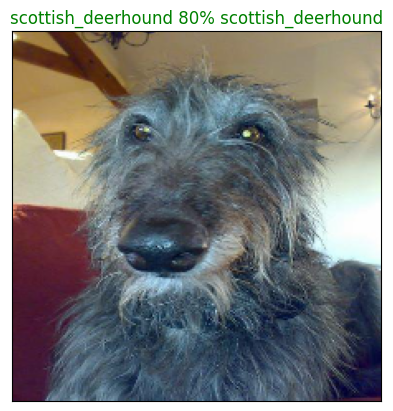

In [ ]:
plot_pred(predictions, val_labels, val_images, 25)

We have made a function to visualize our model predicted labels with its corresponding confident levels and comparison between true label and prediction label and view our true label image

Let's make another to show our models top 10 predictions

This function:
* Take and input of probabilities predictions list and a ground truth array and an integer

* Find the predicted label using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels

* Plot the top 10 probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, true_labels, n=1):
  """
  Plot the top 10 highest prediction confidences alone with the truth label for sample n
  """
  pred_prob, true_label = prediction_probabilities[n], true_labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Get the true label
  true_label = get_pred_label(true_label)

  # Find the top 10 confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),top_10_pred_values,color='grey')

  plt.xticks(np.arange(len(top_10_pred_labels)), labels=top_10_pred_labels, rotation='vertical')

  # Change the color of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green') # Check the index where the true label is exist on the top_10_pred_labels and color it green
  else:
    pass



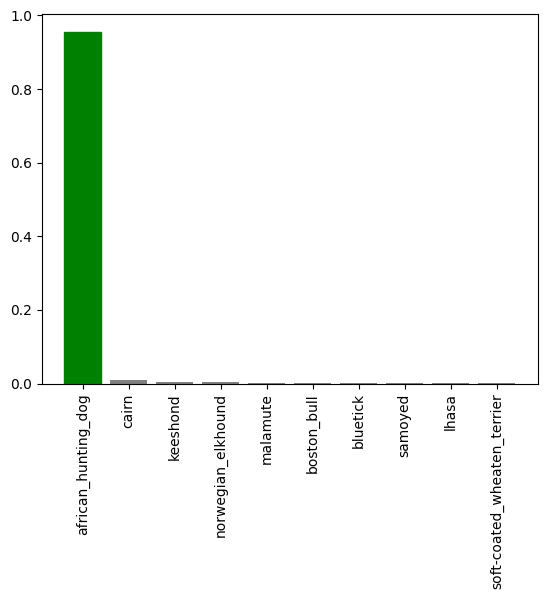

In [ ]:
plot_pred_conf(predictions, val_labels, n=17)

In [ ]:
predictions[0].argsort() # This will give the indexes of the

array([  5,  44,  33,  75,  22,  18, 118,  46, 115,  53,  84, 112,  86,
        61,  92,  38,  24,  63,  41,  55,  16,  47,   1,   3,  39,  72,
        99,  36, 110,  94,  19,  13,  96,  34,  95,  66,  21,  51, 108,
       101,  54,  11,  69, 114,  37,  42,  14,  60, 107, 104,  32, 111,
        43, 113,  45,  50,  30,  78,  28,  82,  52,  31,  29,   2,  15,
        25,  49,  87,  56,  98,   4,  80,  58,  67,  88,   9,  71,  89,
        10,  64,  12,   8,  91,  20,  85,   0,  23,  27,  90,  62,   7,
        57,  48,  40,  74, 117, 119, 116,  81,  76,  97,  93, 105,  65,
        68, 100,  79,   6, 106, 109,  73,  83,  70,  77, 102, 103,  59,
        26,  35,  17])

In [ ]:
predictions[0].argsort()[-10:][::-1] # This will give indexes of top 10 predictions

array([ 17,  35,  26,  59, 103, 102,  77,  70,  83,  73])

In [ ]:
predictions[0].max()

0.3403358

In [ ]:
predictions[0]

array([7.0419034e-04, 3.7671802e-05, 3.1607063e-04, 3.9044924e-05,
       4.0069147e-04, 2.8132754e-06, 1.1141414e-02, 1.2661514e-03,
       5.7070272e-04, 5.0743646e-04, 5.3534651e-04, 9.9236080e-05,
       5.6401140e-04, 5.9034897e-05, 1.7206518e-04, 3.2103606e-04,
       2.5864550e-05, 3.4033579e-01, 7.9226211e-06, 5.6247321e-05,
       6.4178806e-04, 7.8852681e-05, 7.5809648e-06, 8.3464454e-04,
       2.1554904e-05, 3.2140582e-04, 1.4279236e-01, 9.5819443e-04,
       2.6819180e-04, 3.1508814e-04, 2.3166655e-04, 3.0715196e-04,
       1.9069962e-04, 5.6874828e-06, 6.3662395e-05, 1.8013294e-01,
       4.9509399e-05, 1.1375195e-04, 2.1320266e-05, 4.3000153e-05,
       1.6074883e-03, 2.5184931e-05, 1.7073397e-04, 2.0423516e-04,
       5.0467561e-06, 2.2050033e-04, 8.0825193e-06, 2.6496960e-05,
       1.3131578e-03, 3.4655037e-04, 2.2578392e-04, 7.9371675e-05,
       3.0177680e-04, 1.3710135e-05, 9.1132781e-05, 2.5635629e-05,
       3.5764891e-04, 1.2995000e-03, 4.5560920e-04, 6.3077092e

In [ ]:
unique_breeds[np.argmax(predictions[0])]

'border_terrier'

Now we have got some functions to visualize the results and make predictions. Let's try few.

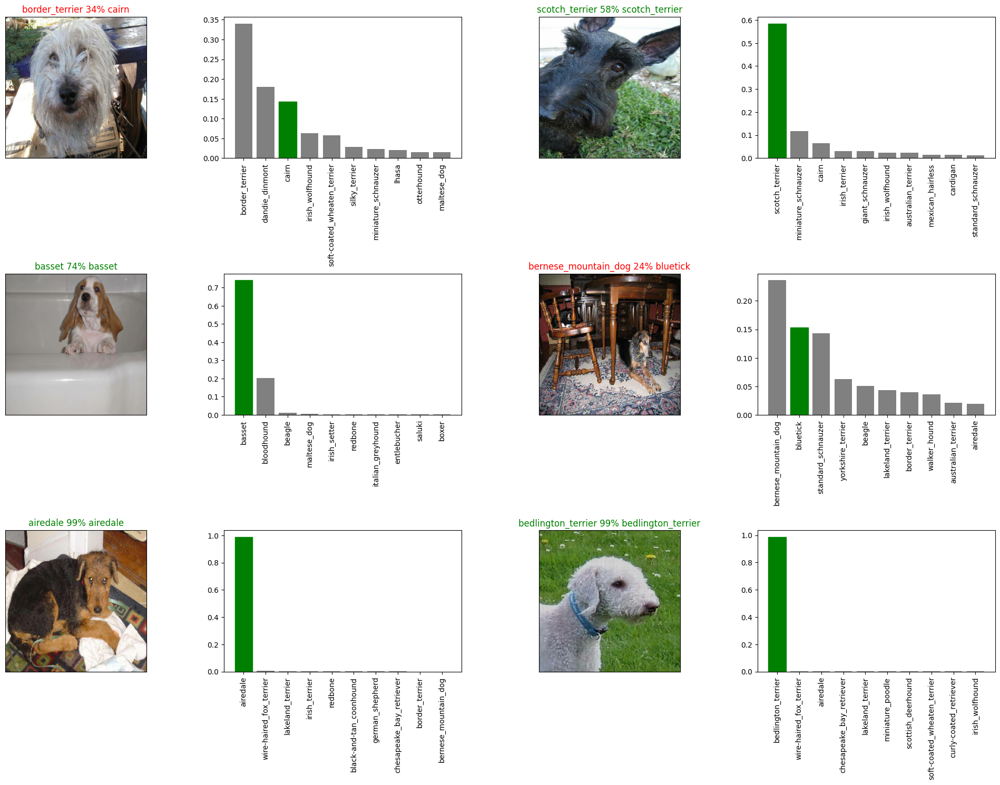

In [ ]:
# Let's checkout few predictions and their different values
i_multiplier = 0 # use to change the starting image currently set to 0 th image
num_rows = 3
num_cols = 2
num_images = num_cols * num_rows

plt.figure(figsize=(10*num_cols,5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols,2*i+1)
  plot_pred(predictions, val_labels, val_images, i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions, val_labels, i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [ ]:
# Create a function to save model
def save_model(model, suffix=None):
  '''
  Save the given model in a models directory and append a suffix (String)
  '''
  # Create a model directory path name with current time
  modeldir = os.path.join('/content/drive/MyDrive/Dog Vision/models',datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))

  model_path = modeldir + '-' + suffix + '.h5' #.h5 is the save format of the model
  print(f'Saving model to {model_path}...')
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a model
def load_model(model_path):
  '''
  Load the saved model from a specified path
  '''
  print(f'Loading model from {model_path}...')
  model = tf.keras.models.load_model(model_path,custom_objects={'KerasLayer':hub.KerasLayer})
  return model

Now we have got functions to save and load models. let's try those

In [ ]:
# Save our model which trained on 1000 dataset
#save_model(model,suffix='1000-dataset-mobilenetv2-Adam')

In [ ]:
# Load the trained model
load_1000_dataset_model = load_model('/content/drive/MyDrive/Dog Vision/models/20230815-12381692103108-1000-dataset-mobilenetv2-Adam.h5')

Loading model from /content/drive/MyDrive/Dog Vision/models/20230815-12381692103108-1000-dataset-mobilenetv2-Adam.h5...


In [ ]:
# Save our model which trained on 1000 dataset
#save_model(model,suffix='1000-dataset-mobilenetv2-Adam-v2')

In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 91ms/step - loss: 1.2419 - accuracy: 0.6400


[1.2418872117996216, 0.6399999856948853]

In [ ]:
# Evaluate the saved model
load_1000_dataset_model.evaluate(val_data)

7/7 [==============================] - 1s 129ms/step - loss: 1.2419 - accuracy: 0.6400


[1.2418872117996216, 0.6399999856948853]

## Training a big dog model on full training dataset

In [ ]:
len(x),len(y)

(10222, 10222)

In [ ]:
# Create a bata-batch with a full dataset
full_data = create_data_batches(x,y)

Creating training data batches.....


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set on training on full dataset. So we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)

**Note** Running the cell below willl take around 30 minutes to execute first epoch of our model because of the computation power. That's why we first work with small amount of data and lastly deal with the all the and train the model will full data.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 41s 112ms/step - loss: 1.3409 - accuracy: 0.6687
Epoch 2/100
320/320 [==============================] - 34s 107ms/step - loss: 0.3959 - accuracy: 0.8860
Epoch 3/100
320/320 [==============================] - 37s 115ms/step - loss: 0.2361 - accuracy: 0.9337
Epoch 4/100
320/320 [==============================] - 40s 123ms/step - loss: 0.1532 - accuracy: 0.9628
Epoch 5/100
320/320 [==============================] - 49s 153ms/step - loss: 0.1042 - accuracy: 0.9797
Epoch 6/100
320/320 [==============================] - 39s 123ms/step - loss: 0.0779 - accuracy: 0.9870
Epoch 7/100
320/320 [==============================] - 34s 106ms/step - loss: 0.0587 - accuracy: 0.9906
Epoch 8/100
320/320 [==============================] - 37s 115ms/step - loss: 0.0452 - accuracy: 0.9935
Epoch 9/100
320/320 [==============================] - 34s 106ms/step - loss: 0.0372 - accuracy: 0.9962
Epoch 10/100
320/320 [==============================] - 36s 112m

In [ ]:
# save the full model which trained with full data
#save_model(full_model,suffix='full-dataset-mobilenetv2-Adam')

In [ ]:
#Load the full-model
loaded_full_model = load_model('/content/drive/MyDrive/Dog Vision/models/20230815-12531692104039-full-dataset-mobilenetv2-Adam.h5')

Loading model from /content/drive/MyDrive/Dog Vision/models/20230815-12531692104039-full-dataset-mobilenetv2-Adam.h5...


## Making predicitons on the test dataset

To make predictions on our test data, we need to convert our test data into form of Tensor Batches, because we trained our model by converting our training data into Tensor Batches

To make the predictions on test data:
* get the test image filenames
* convert filenames into test data batches using `create_data_catches()` and setting the `test_data` parameter to `True` (Since the test data doesn't have labels)
* make a predictions by passing the test batches to the `predict()` method called on our model

In [ ]:
# load test image filename
test_path = '/content/drive/MyDrive/Dog Vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

In [ ]:
# Convert test data into test data batches using create_data_batches function
test_data = create_data_batches(x=test_filenames,test_data=True)

creating test data batches...


In [ ]:
# make predictions on test_data using loaded full model
test_predictions = loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 213s 633ms/step


In [ ]:
# Save predictions to csv file
#np.savetxt('/content/drive/MyDrive/Dog Vision/preds_array.csv', test_predictions, delimiter=',')

In [ ]:
# load saved test predictions
test_preds = np.loadtxt('/content/drive/MyDrive/Dog Vision/preds_array.csv', delimiter=',')

In [ ]:
len(test_preds)

10357

In [ ]:
test_preds.shape

(10357, 120)

## Preparing test dataset predictions for kaggle
https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

By looking at the kaggle evaluation requirement, we decided to create DataFrame which contains id and a column that includes breeds of each dog

To get the data in this format:
* Create a pandas dataframe with an Id and a column with dog breeds
* Add data to the ID column by extracting the file names from the images
* Add data (test_prediction_probabilities to each data column)
* Export the dataframe as a csv to submit it to kaggle


In [ ]:
# Create pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_filenames[:10]

['/content/drive/MyDrive/Dog Vision/test/e1bc331d2667664376a50f7ff627ec5d.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e3cec8d0c1876ac36942d35f64b9dfa0.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e47de0441a48f2eff7c2faacd350ed06.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e7340d1efa70bf6d6c134e1e150f9473.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e062ea256ada165dfe998fbc6529dff7.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e7e9624f2a2e61ab187358f5968bfde8.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e1444b7c629f6775432269bfd9c7e758.jpg',
 '/content/drive/MyDrive/Dog Vision/test/dccf2e91f79396055e7ff83f1f207fbc.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e280f6f772fa8439dcf0957a0e8b8e1d.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e4fc0f20883984209dd64dff54dc89a0.jpg']

In [ ]:
# Append test image ID's to predictions DataFrame
test_images_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_images_ids
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e1bc331d2667664376a50f7ff627ec5d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e3cec8d0c1876ac36942d35f64b9dfa0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e47de0441a48f2eff7c2faacd350ed06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e7340d1efa70bf6d6c134e1e150f9473,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e062ea256ada165dfe998fbc6529dff7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,0917cea14ed14bb43c7ca5ead4f38266,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10353,07eee2f7339d2ed306bfa6d032b1eee2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10354,07e4edc428816ffe6b8dd1024bed2782,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10355,086a6fe01b1805017e8cef3c9ccb52ab,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add prediction probabilities for each image to each dog breed
preds_df[list(unique_breeds)] = test_predictions

In [ ]:
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e1bc331d2667664376a50f7ff627ec5d,4.039762e-08,1.134780e-09,1.386892e-08,4.469486e-08,5.498649e-09,1.050152e-10,8.744818e-05,1.368822e-08,6.037754e-11,...,4.742893e-08,4.446977e-08,1.870551e-08,1.139523e-09,6.748915e-10,1.601126e-09,2.777776e-09,3.087013e-08,6.122603e-07,1.902212e-05
1,e3cec8d0c1876ac36942d35f64b9dfa0,1.059014e-10,3.614906e-14,5.230514e-11,1.230232e-09,1.690604e-04,5.015409e-12,7.886426e-10,1.115636e-12,2.380520e-13,...,9.245485e-11,3.645897e-12,2.015981e-11,8.395261e-11,1.399936e-12,8.989581e-12,9.007251e-10,2.333355e-09,7.561973e-09,7.412746e-12
2,e47de0441a48f2eff7c2faacd350ed06,7.351152e-05,1.176915e-05,2.150363e-07,3.081883e-09,4.207799e-10,1.274315e-04,6.793078e-07,9.812707e-05,3.438719e-09,...,6.419678e-10,2.126607e-12,1.239243e-10,5.362839e-04,1.467732e-08,2.873056e-05,8.889074e-02,2.456156e-06,1.002464e-07,6.033527e-09
3,e7340d1efa70bf6d6c134e1e150f9473,1.648335e-10,1.659492e-07,4.468357e-10,8.617167e-08,3.004553e-09,1.525561e-05,3.442080e-11,2.575002e-10,6.441467e-11,...,1.306500e-09,4.436346e-12,1.139200e-09,1.446158e-06,1.203150e-09,1.932565e-10,4.387867e-11,1.303910e-06,8.140848e-12,3.265350e-10
4,e062ea256ada165dfe998fbc6529dff7,1.422919e-09,7.308449e-08,2.104833e-06,5.493695e-10,8.683974e-10,1.807623e-06,2.314478e-08,1.573891e-08,4.476596e-09,...,1.334816e-09,1.719766e-09,2.587855e-11,5.359507e-07,1.525331e-07,5.378385e-09,1.074070e-08,3.601369e-10,2.791602e-08,6.678126e-08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,0917cea14ed14bb43c7ca5ead4f38266,5.857231e-12,1.597982e-03,2.209496e-08,2.088877e-10,3.179832e-07,2.462042e-08,2.503563e-08,9.265999e-04,1.404362e-05,...,2.589969e-09,4.012604e-08,2.817879e-05,2.435733e-05,6.678948e-07,2.979340e-07,2.172661e-09,1.806731e-04,2.336997e-09,1.127250e-06
10353,07eee2f7339d2ed306bfa6d032b1eee2,4.560807e-12,3.363670e-06,4.275012e-01,3.454169e-08,8.005144e-10,9.513958e-11,2.011979e-09,1.030934e-10,3.212738e-08,...,3.834204e-11,1.539026e-13,7.538965e-10,3.760485e-09,5.544039e-10,1.046042e-08,2.539423e-10,6.304646e-07,1.663655e-09,3.872084e-10
10354,07e4edc428816ffe6b8dd1024bed2782,2.014130e-04,3.318288e-08,1.699509e-06,9.083537e-07,5.072033e-09,1.515746e-08,1.701571e-07,3.830144e-08,4.524229e-10,...,7.495298e-06,5.003486e-07,1.237888e-08,1.098182e-07,2.822770e-09,2.011632e-10,6.727554e-07,1.389607e-07,7.848706e-08,1.494772e-05
10355,086a6fe01b1805017e8cef3c9ccb52ab,1.547354e-08,1.504544e-11,2.163142e-10,2.391641e-14,2.119356e-08,8.988572e-11,5.959805e-09,1.359696e-11,5.837021e-10,...,8.350889e-12,3.159482e-08,1.232876e-10,7.188688e-10,2.036511e-10,1.109492e-10,9.999853e-01,1.782770e-10,7.908530e-12,5.135626e-09


In [ ]:
# convert preds_df to csv and save
#preds_df.to_csv('/content/drive/MyDrive/Dog Vision/full_model_test_predictions_1_mobilenetv2.csv',index=False)

## Make predictions on custom images

To make predictions with custom images we need to:
* Get the file from the filepath
* convert file into data batch using `create_data_batches`, since our custom data don't have labels, we set `test_data==True`
* Pas the custom image to our model `predict` function
* convert the prediction probabilities to prediction labels.
* compare the predicted labels to the custom images.

In [ ]:
# Set custom image file path
custom_path = '/content/drive/MyDrive/Dog Vision/custom-images/'

#Create file paths
custom_image_filenames = [custom_path + file for file in os.listdir(custom_path)]
custom_image_filenames

['/content/drive/MyDrive/Dog Vision/custom-images/dog-photo-3.jpeg',
 '/content/drive/MyDrive/Dog Vision/custom-images/dog-photo-2.jpeg',
 '/content/drive/MyDrive/Dog Vision/custom-images/dog-photo-1.jpeg',
 '/content/drive/MyDrive/Dog Vision/custom-images/doberman.jpg',
 '/content/drive/MyDrive/Dog Vision/custom-images/plush-coat-german-shepherd-1.jpg']

In [ ]:
# convert custom images to data batches
custom_data_batch = create_data_batches(x=custom_image_filenames,test_data=True)
custom_data_batch

creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:

# Make predictions
custom_images_predictions = loaded_full_model.predict(custom_data_batch)

1/1 [==============================] - 0s 420ms/step


In [ ]:
custom_images_predictions.shape

(5, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_images_predictions[i]) for i in range(len(custom_images_predictions))]
custom_pred_labels

['labrador_retriever',
 'lakeland_terrier',
 'golden_retriever',
 'doberman',
 'german_shepherd']

In [ ]:
# Get custom images (our unbatchify function won't work because we do not have labels in custom data batch)
custom_images=[]
for image in custom_data_batch.unbatch().as_numpy_iterator():
  custom_images.append(image)

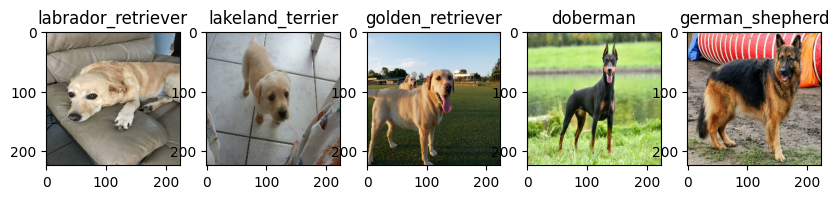

In [ ]:
# Check custom predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,len(custom_images),i+1)
  plt.title(custom_pred_labels[i])
  plt.imshow(image)